In [1]:
!pip install geopandas pyproj shapely

In [2]:
from google.colab import files
uploaded = files.upload()

Saving 20_MPH_Zones.csv to 20_MPH_Zones.csv
Saving CCTV_and_Traffic_Cameras.csv to CCTV_and_Traffic_Cameras.csv
Saving City_Centre_On_Street_Parking_Zones.csv to City_Centre_On_Street_Parking_Zones.csv
Saving Grit_bins_.csv to Grit_bins_.csv
Saving Highway_Drain_Links.csv to Highway_Drain_Links.csv
Saving Highway_Drain_Nodes.csv to Highway_Drain_Nodes.csv
Saving Household_Waste_Recycling_Centres.csv to Household_Waste_Recycling_Centres.csv
Saving Libraries.csv to Libraries.csv
Saving Local_Nature_Reserve.csv to Local_Nature_Reserve.csv
Saving Local_Wildlife_Sites.csv to Local_Wildlife_Sites.csv
Saving Parks_&_Countryside_Service_Sites.csv to Parks_&_Countryside_Service_Sites.csv
Saving Public_Rights_Of_Way_Working_Copy.csv to Public_Rights_Of_Way_Working_Copy.csv
Saving School_Crossings.csv to School_Crossings.csv
Saving Sheffield_SFRA_Floodzone_3ai.csv to Sheffield_SFRA_Floodzone_3ai.csv
Saving SuDS_Links.csv to SuDS_Links.csv
Saving Tree_Preservation_Order_(Points).csv to Tree_Preser

In [98]:
import pandas as pd
from pyproj import Transformer
import os

# Initialize coordinate transformer (EPSG:27700 → EPSG:4326)
transformer = Transformer.from_crs("epsg:27700", "epsg:4326", always_xy=True)

# List of files to process
csv_files = [
    "Libraries.csv",
    "School_Crossings.csv",
    "CCTV_and_Traffic_Cameras.csv",
    "Household_Waste_Recycling_Centres.csv",
    "Tree_Preservation_Order_(Points).csv",
    "Parks_&_Countryside_Service_Sites.csv",
    "Local_Nature_Reserve.csv",
    "Local_Wildlife_Sites.csv",
    "Sheffield_SFRA_Floodzone_3ai.csv",
    "SuDS_Links.csv",
    "Highway_Drain_Nodes.csv",
    "Highway_Drain_Links.csv",
    "Grit_bins_.csv",
    "Public_Rights_Of_Way_Working_Copy.csv",
    "20_MPH_Zones.csv",
    "City_Centre_On_Street_Parking_Zones.csv"
]

# Loop through each file
for filename in csv_files:
    try:
        df = pd.read_csv(filename)
        if 'X' in df.columns and 'Y' in df.columns:
            df['longitude'], df['latitude'] = transformer.transform(df['X'].values, df['Y'].values)
            print(f"Converted: {filename}")
        else:
            print(f"Skipped (no X/Y): {filename}")
        df.to_csv(filename.replace(".csv", "_converted.csv"), index=False)
    except Exception as e:
        print(f" Error processing {filename}: {e}")


Converted: Libraries.csv
Converted: School_Crossings.csv
Converted: CCTV_and_Traffic_Cameras.csv
Converted: Household_Waste_Recycling_Centres.csv
Converted: Tree_Preservation_Order_(Points).csv
Skipped (no X/Y): Parks_&_Countryside_Service_Sites.csv
Skipped (no X/Y): Local_Nature_Reserve.csv
Skipped (no X/Y): Local_Wildlife_Sites.csv
Skipped (no X/Y): Sheffield_SFRA_Floodzone_3ai.csv
Skipped (no X/Y): SuDS_Links.csv
Skipped (no X/Y): Highway_Drain_Nodes.csv
Skipped (no X/Y): Highway_Drain_Links.csv
Converted: Grit_bins_.csv
Skipped (no X/Y): Public_Rights_Of_Way_Working_Copy.csv
Skipped (no X/Y): 20_MPH_Zones.csv
Skipped (no X/Y): City_Centre_On_Street_Parking_Zones.csv


In [39]:

converted_files = [
    "Libraries_converted.csv",
    "School_Crossings_converted.csv",
    "CCTV_and_Traffic_Cameras_converted.csv",
    "Household_Waste_Recycling_Centres_converted.csv",
    "Tree_Preservation_Order_(Points)_converted.csv",
    "Grit_bins__converted.csv"
]

for file in converted_files:
    print(f"\n--- Sample from {file} ---\n")
    try:
        df = pd.read_csv(file)
        display(df[['latitude', 'longitude']].join(df.drop(columns=['latitude', 'longitude']).head(3)))
    except Exception as e:
        print(f"Error loading {file}: {e}")



--- Sample from Libraries_converted.csv ---



,latitude,longitude,X,Y,objectid,library,number,street,town,postcode,url,delivery,type,open,contact
0,53.377825,-1.502919,433165.5805,386889.6239,1.0,Broomhill,,Taptonville Road,Sheffield,S10 5BR,"<A href=""https://www.sheffield.gov.uk/librarie...",Co-delivered,Volunteer,"<a href=""https://volunteerlibrariesinsheffield...","<a href=""https://volunteerlibrariesinsheffield..."
1,53.391942,-1.458528,436106.7637,388481.6208,2.0,Burngreave,42,Spital Hill,Sheffield,S4 7LG,"<A href=""https://www.sheffield.gov.uk/librarie...",Co-delivered,Volunteer,"<a href=""https://volunteerlibrariesinsheffield...","<a href=""https://volunteerlibrariesinsheffield..."
2,53.461875,-1.469438,435323.3629,396256.2496,3.0,Chapeltown,,Nether Ley Avenue,Sheffield,S35 1AE,"<A href=""https://www.sheffield.gov.uk/librarie...",Council,Hub,Monday: 10am to 5pm\r\nTuesday: 10am to 5pmWed...,"<a href=""mailto:chapeltown.library@sheffield.g..."
3,53.386680,-1.410591,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,53.439538,-1.464533,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,53.348265,-1.401042,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,53.343330,-1.422762,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,53.326492,-1.488776,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,53.366842,-1.474816,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,53.406885,-1.502601,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



--- Sample from School_Crossings_converted.csv ---



,latitude,longitude,X,Y,objectid,school,location,fromtimeam,totimeam,fromtimepm,totimepm,easting,northing
0,53.339024,-1.485255,434371.7700,382581.3100,1.0,ABBEY LANE PRIMARY,SCHOOL GATE / ABBEY LN / ZEBRA,08:25:00,08:50:00,15:05:00,15:25:00,434367.262,382577.983
1,53.362186,-1.468232,435486.0870,385166.3002,4.0,ANNS GROVE PRIMARY,SPENCER RD / ANNS RD / PELICAN,08:30:00,09:00:00,15:10:00,15:10:00,435499.281,385159.435
2,53.371718,-1.397140,440208.2078,386264.3090,8.0,ATHELSTAN PRIMARY,RICHMOND PARK ROAD/RICHMOND PARK CLOSE,08:10:00,08:45:00,14:55:00,15:30:00,440211.996,386259.193
3,53.354648,-1.449931,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,53.345686,-1.403008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,53.346300,-1.388420,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,53.357938,-1.365013,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,53.360160,-1.362080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,53.411352,-1.472495,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,53.355990,-1.464089,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



--- Sample from CCTV_and_Traffic_Cameras_converted.csv ---



,latitude,longitude,X,Y,objectid,location,notes,cam_number
0,53.377659,-1.464444,435725.23,386889.63,119.0,Sheaf Street / Howard Street,ITS Traffic Camera,1
1,53.374515,-1.462690,435844.58,386540.72,120.0,Granville Square Roundabout,ITS Traffic Camera,2
2,53.372837,-1.473194,435147.13,386348.82,121.0,Bramall Lane Rbt / St Marys / Bramall Lane,ITS Traffic Camera,3
3,53.373959,-1.478888,NaN,NaN,NaN,NaN,NaN,NaN
4,53.382027,-1.484241,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
207,53.367397,-1.480672,NaN,NaN,NaN,NaN,NaN,NaN
208,53.372126,-1.478736,NaN,NaN,NaN,NaN,NaN,NaN
209,53.370398,-1.482394,NaN,NaN,NaN,NaN,NaN,NaN
210,53.418187,-1.447569,NaN,NaN,NaN,NaN,NaN,NaN



--- Sample from Household_Waste_Recycling_Centres_converted.csv ---



,latitude,longitude,X,Y,objectid,name,paper,glass,textiles,plastic,...,motoroil,flotubes,grwaste,rubble,carbat,scrapmet,wood,hholdbat,whitgds,mobphone
0,53.410240,-1.479537,434694.7815,390506.8907,1.0,"Longley Avenue West, S5 7HF",Yes,Yes,Yes,Yes,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
1,53.353923,-1.353137,443153.7815,384310.3278,2.0,"Beighton Road, S13 7PS",Yes,Yes,Yes,Yes,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
2,53.351652,-1.451407,436614.7815,384002.8907,3.0,"Blackstock Road, S14 1FY",Yes,Yes,Yes,Yes,...,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
3,53.479233,-1.492872,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,53.472301,-1.563051,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



--- Sample from Tree_Preservation_Order_(Points)_converted.csv ---



,latitude,longitude,X,Y,objectid,reg_no,part,act,year,section,sdesc,desc_,feat_num,test,keyval,tpo_ref,tree_ref,amended
0,53.367160,-1.561446,429279.421,385677.640,68906.0,1793.0,3b,Town and,1971.0,60 & 61,Tree Preservation Orde,TPO No. 808/110,6169.0,1.0,A38,808/110,NaN,NaN
1,53.367902,-1.559996,429375.353,385760.708,68907.0,1793.0,3b,Town and,1971.0,60 & 61,Tree Preservation Orde,TPO No. 808/110,6169.0,1.0,A39,808/110,NaN,NaN
2,53.367920,-1.559853,429384.912,385762.798,68908.0,1793.0,3b,Town and,1971.0,60 & 61,Tree Preservation Orde,TPO No. 808/110,6169.0,1.0,A40,808/110,NaN,NaN
3,53.403287,-1.497746,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,53.403179,-1.497308,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1271,53.375078,-1.539992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1272,53.374915,-1.539905,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1273,53.374871,-1.539860,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1274,53.374902,-1.539659,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN



--- Sample from Grit_bins__converted.csv ---



,latitude,longitude,X,Y,sitename,featurelocation,objectid
0,53.408100,-1.519160,432062.5031,390250.2712,BEN LANE,Adj Wisewood Community Primary School,1.0
1,53.337799,-1.482481,434557.4999,382446.3251,GREENHILL ROAD,opp 44 - top of cul de sac,3.0
2,53.441136,-1.492464,433811.0332,393937.9356,CINDER HILL LANE,o/s 68,4.0
3,53.344152,-1.531852,NaN,NaN,NaN,NaN,NaN
4,53.391106,-1.493903,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2387,53.438570,-1.489413,NaN,NaN,NaN,NaN,NaN
2388,53.389299,-1.498989,NaN,NaN,NaN,NaN,NaN
2389,53.473038,-1.579072,NaN,NaN,NaN,NaN,NaN
2390,53.318784,-1.512171,NaN,NaN,NaN,NaN,NaN


In [40]:
df = df.dropna(subset=['latitude', 'longitude'])


In [41]:
import geopandas as gpd
from shapely.geometry import Point, box

# Define rough bounding box for Sheffield (adjustable if needed)
minx, miny = -1.62, 53.29
maxx, maxy = -1.32, 53.52
cell_size = 0.005  # approx ~500m in lat/lon

# Create grid cells
grid_cells = []
x = minx
while x < maxx:
    y = miny
    while y < maxy:
        grid_cells.append(box(x, y, x + cell_size, y + cell_size))
        y += cell_size
    x += cell_size

grid = gpd.GeoDataFrame({'geometry': grid_cells})
grid.crs = "EPSG:4326"
grid['cell_id'] = grid.index


In [43]:
def join_points_to_grid(filename, label):
    df = pd.read_csv(filename)
    df = df.dropna(subset=['latitude', 'longitude'])
    gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['longitude'], df['latitude']), crs="EPSG:4326")
    joined = gpd.sjoin(grid, gdf, how="left", predicate='contains')
    return joined.groupby('cell_id').size().rename(label)


In [44]:
# Process all datasets
library_count = join_points_to_grid("Libraries_converted.csv", "library_count")
crossing_count = join_points_to_grid("School_Crossings_converted.csv", "crossing_count")
cctv_count = join_points_to_grid("CCTV_and_Traffic_Cameras_converted.csv", "cctv_count")
recycling_count = join_points_to_grid("Household_Waste_Recycling_Centres_converted.csv", "recycling_count")
tree_count = join_points_to_grid("Tree_Preservation_Order_(Points)_converted.csv", "tree_count")
grit_bin_count = join_points_to_grid("Grit_bins__converted.csv", "grit_bin_count")


In [11]:
# # Combine all features into grid
# grid_features = grid.set_index('cell_id').copy()
# grid_features = grid_features.join([
#     library_count,
#     crossing_count,
#     cctv_count,
#     recycling_count,
#     tree_count,
#     grit_bin_count
# ])

# #only convert count columns to int
# cols_to_int = ['library_count', 'crossing_count', 'cctv_count', 'recycling_count', 'tree_count', 'grit_bin_count']
# grid_features[cols_to_int] = grid_features[cols_to_int].fillna(0).astype(int)

# grid_features.reset_index(inplace=True)
# grid_features.head()


,cell_id,geometry,library_count,crossing_count,cctv_count,recycling_count,tree_count,grit_bin_count
0,0,"POLYGON ((-1.615 53.29, -1.615 53.295, -1.62 5...",1,1,1,1,1,1
1,1,"POLYGON ((-1.615 53.295, -1.615 53.3, -1.62 53...",1,1,1,1,1,1
2,2,"POLYGON ((-1.615 53.3, -1.615 53.305, -1.62 53...",1,1,1,1,1,1
3,3,"POLYGON ((-1.615 53.305, -1.615 53.31, -1.62 5...",1,1,1,1,1,1
4,4,"POLYGON ((-1.615 53.31, -1.615 53.315, -1.62 5...",1,1,1,1,1,1


In [12]:
# Summary statistics for each feature
# grid_features[['library_count', 'crossing_count', 'cctv_count', 'recycling_count', 'tree_count', 'grit_bin_count']].describe()


,library_count,crossing_count,cctv_count,recycling_count,tree_count,grit_bin_count
count,2806.000000,2806.000000,2806.000000,2806.0,2806.000000,2806.000000
mean,1.000356,1.001782,1.043122,1.0,1.408767,1.594084
std,0.018878,0.049924,0.567002,0.0,3.154497,1.637643
min,1.000000,1.000000,1.000000,1.0,1.000000,1.000000
25%,1.000000,1.000000,1.000000,1.0,1.000000,1.000000
50%,1.000000,1.000000,1.000000,1.0,1.000000,1.000000
75%,1.000000,1.000000,1.000000,1.0,1.000000,1.000000
max,2.000000,3.000000,17.000000,1.0,56.000000,16.000000


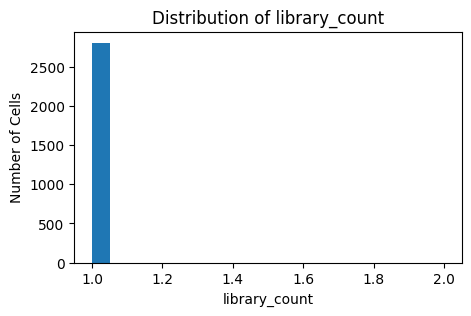

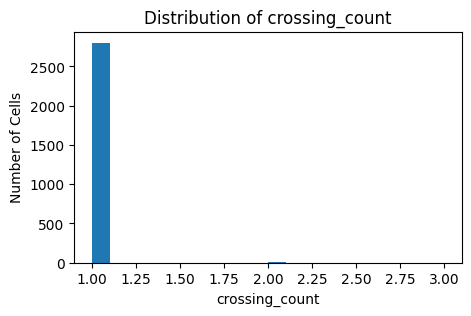

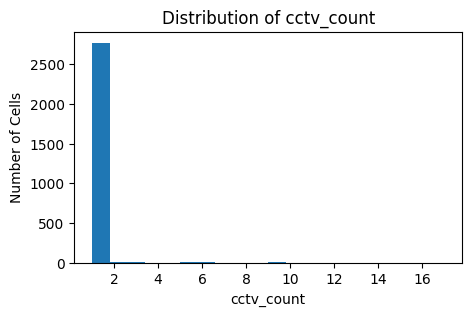

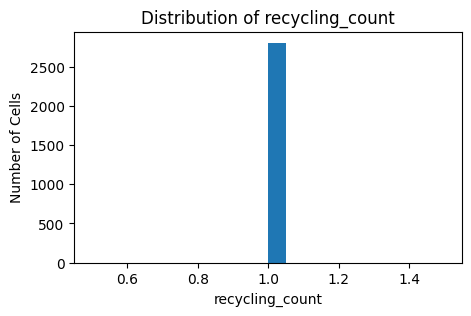

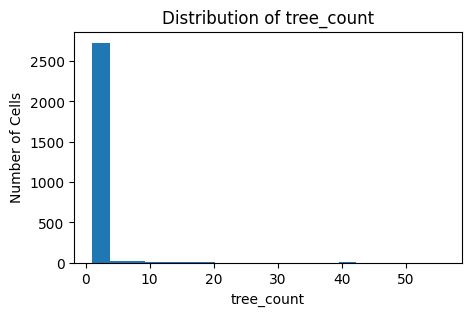

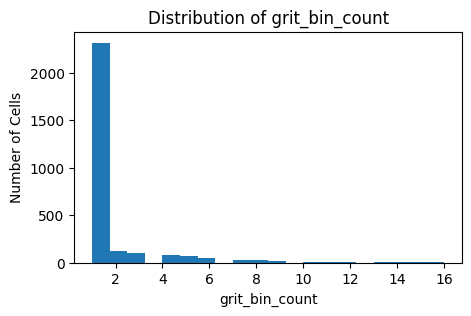

In [13]:
# import matplotlib.pyplot as plt

# features = ['library_count', 'crossing_count', 'cctv_count', 'recycling_count', 'tree_count', 'grit_bin_count']
# for feature in features:
#     plt.figure(figsize=(5,3))
#     grid_features[feature].hist(bins=20)
#     plt.title(f'Distribution of {feature}')
#     plt.xlabel(feature)
#     plt.ylabel('Number of Cells')
#     plt.grid(False)
#     plt.show()


checking one by one

In [45]:
import re
from bs4 import BeautifulSoup

# Load dataset
df = pd.read_csv("Libraries.csv")

# Clean HTML from 'url', 'open', 'contact'
for col in ['url', 'open', 'contact']:
    df[col] = df[col].apply(lambda x: BeautifulSoup(str(x), "html.parser").get_text())

# Normalize 'type' to lowercase
df['type'] = df['type'].str.strip().str.lower()

# Preview cleaned data
df[['library', 'postcode', 'type', 'open']].head()


,library,postcode,type,open
0,Broomhill,S10 5BR,volunteer,Opening hours on Volunteer Libraries in Sheffi...
1,Burngreave,S4 7LG,volunteer,Opening hours on Volunteer Libraries in Sheffi...
2,Chapeltown,S35 1AE,hub,Monday: 10am to 5pm\r\nTuesday: 10am to 5pmWed...
3,Darnall,S9 5JG,hub,Monday: 10am to 5pm\r\nTuesday: 10am to 5pm\r\...
4,Ecclesfield,S35 9UA,volunteer,Opening hours on Volunteer Libraries in Sheffi...


In [46]:
df['is_hub'] = (df['type'] == 'hub').astype(int)

In [47]:
# School_Crossings.csv

from datetime import datetime

# Load dataset
df = pd.read_csv("School_Crossings.csv")

# Drop rows missing spatial coordinates
df = df.dropna(subset=['X', 'Y'])

# Calculate AM and PM durations in minutes
def time_diff(start, end):
    try:
        s = datetime.strptime(start, "%H:%M:%S")
        e = datetime.strptime(end, "%H:%M:%S")
        return (e - s).seconds / 60
    except:
        return None

df["duration_am"] = df.apply(lambda row: time_diff(row["fromtimeam"], row["totimeam"]), axis=1)
df["duration_pm"] = df.apply(lambda row: time_diff(row["fromtimepm"], row["totimepm"]), axis=1)

# Preview cleaned output
df[["school", "location", "fromtimeam", "totimeam", "duration_am", "fromtimepm", "totimepm", "duration_pm"]].head()


,school,location,fromtimeam,totimeam,duration_am,fromtimepm,totimepm,duration_pm
0,ABBEY LANE PRIMARY,SCHOOL GATE / ABBEY LN / ZEBRA,08:25:00,08:50:00,25.0,15:05:00,15:25:00,20.0
1,ANNS GROVE PRIMARY,SPENCER RD / ANNS RD / PELICAN,08:30:00,09:00:00,30.0,15:10:00,15:10:00,0.0
2,ATHELSTAN PRIMARY,RICHMOND PARK ROAD/RICHMOND PARK CLOSE,08:10:00,08:45:00,35.0,14:55:00,15:30:00,35.0
3,BANKWOOD PRIMARY,BANKWOOD ROAD/BLACKSTOCK ROAD,08:15:00,08:55:00,40.0,15:10:00,15:35:00,25.0
4,BIRLEY PRIMARY,THORNBRIDGE DR / THORNBRIDGE AVE,08:20:00,08:50:00,30.0,15:05:00,15:40:00,35.0


In [48]:
#CCTV_and_Traffic_Cameras.csv

# Load dataset
df = pd.read_csv("CCTV_and_Traffic_Cameras.csv")

# Fill missing notes with "Unknown"
df["notes"] = df["notes"].fillna("Unknown")

# classify camera type
df["camera_type"] = df["notes"].apply(
    lambda x: "Traffic" if "traffic" in str(x).lower() else "Other"
)

# Preview cleaned sample
df[["location", "notes", "camera_type"]].head()


,location,notes,camera_type
0,Sheaf Street / Howard Street,ITS Traffic Camera,Traffic
1,Granville Square Roundabout,ITS Traffic Camera,Traffic
2,Bramall Lane Rbt / St Marys / Bramall Lane,ITS Traffic Camera,Traffic
3,Moore Street Rbt / St Marys Gate / Moore Street,ITS Traffic Camera,Traffic
4,Brookhill Rbt / Broad Lane / Upper Hanover Street,ITS Traffic Camera,Traffic


In [49]:
# Household_Waste_Recycling_Centres.csv


# Load the dataset
df = pd.read_csv("Household_Waste_Recycling_Centres.csv")

# Convert 'Yes'/'No' to binary 1/0 in material columns
material_columns = df.columns[4:]  # From 'paper' onward
df[material_columns] = df[material_columns].applymap(lambda x: 1 if str(x).strip().lower() == "yes" else 0)

# Compute total recycling score = how many materials are accepted
df["recycling_score"] = df[material_columns].sum(axis=1)

# Preview cleaned output
df[["name", "recycling_score"] + material_columns[:5].tolist()].head()


<ipython-input-49-1473f8017949>:10: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df[material_columns] = df[material_columns].applymap(lambda x: 1 if str(x).strip().lower() == "yes" else 0)


,name,recycling_score,paper,glass,textiles,plastic,steelcans
0,"Longley Avenue West, S5 7HF",21,1,1,1,1,1
1,"Beighton Road, S13 7PS",21,1,1,1,1,1
2,"Blackstock Road, S14 1FY",21,1,1,1,1,1
3,"High Green, Greaves Lane S35 4GR",21,1,1,1,1,1
4,"Deepcar, Manchester Road, S36 2DT",21,1,1,1,1,1


In [50]:

#Tree_Preservation_Order_(Points).csv
# Load the dataset
df = pd.read_csv("Tree_Preservation_Order_(Points).csv")

# Drop rows with missing coordinates (should be none, but safe)
df = df.dropna(subset=['X', 'Y'])

# Optional: Filter and keep important columns
df_cleaned = df[['X', 'Y', 'year', 'desc_', 'tpo_ref']]

# Show sample output
df_cleaned.head()


,X,Y,year,desc_,tpo_ref
0,429279.421,385677.640,1971,TPO No. 808/110,808/110
1,429375.353,385760.708,1971,TPO No. 808/110,808/110
2,429384.912,385762.798,1971,TPO No. 808/110,808/110
3,433489.811,389724.673,1971,TPO No. 808/56 : T7,808/56
4,433519.038,389712.905,1971,TPO No. 808/56 : T8,808/56


In [51]:
#Parks_&_Countryside_Service_Sites.csv

# Load the dataset
df = pd.read_csv("Parks_&_Countryside_Service_Sites.csv")

# Fill missing 'site_type' with 'Unknown'
df['site_type'] = df['site_type'].fillna('Unknown')

# Keep only useful columns
df_cleaned = df[['site_name', 'site_type', 'shape_Area']]

# Preview the cleaned data
df_cleaned.head()


,site_name,site_type,shape_Area
0,Arbourthorne Pond Playground,Playgrounds,1418.314647
1,Lowfield Park Playground,Playgrounds,1374.152630
2,Clarkehouse Road,Unknown,569.548892
3,Hillsborough Sports Centre and surrounding area,Unknown,16204.659638
4,Asline Road/Bramall Lane,Open Space,1343.339267


In [52]:
#Local_Nature_Reserve.csv
# Load the dataset
df = pd.read_csv("Local_Nature_Reserve.csv")

# Keep only useful fields
# (st_areashape = area of reserve; title = site name)
df_cleaned = df[['title', 'st_areashape']]

# Rename for clarity
df_cleaned = df_cleaned.rename(columns={'title': 'reserve_name', 'st_areashape': 'area_m2'})

# Preview output
df_cleaned.head()

,reserve_name,area_m2
0,Wheata Woods Complex,5.468623e+05
1,Ecclesall Woods,1.352951e+06
2,Wooley Woods,3.523326e+05
3,Roe Woods & Crab Tree Pond,1.548129e+05
4,Bowden Howsteads/Spring Wood & Carbrook Ravine,3.754487e+05


In [53]:
#Local_Wildlife_Sites.csv
# Load dataset
df = pd.read_csv("Local_Wildlife_Sites.csv")

# Create a binary column: 1 if site has positive ecological value ('Y'), else 0
df['biodiverse'] = df['positive_m'].apply(lambda x: 1 if str(x).strip().upper() == 'Y' else 0)

# Keep only important columns
df_cleaned = df[['site_name', 'designatio', 'biodiverse', 'st_areashape']]

# Rename for clarity
df_cleaned = df_cleaned.rename(columns={'st_areashape': 'area_m2'})

# Preview cleaned output
df_cleaned.head()

,site_name,designatio,biodiverse,area_m2
0,Cockshot Hill,LWS,0,19162.955340
1,Fox Glen Wood,LWS,1,47099.928952
2,Glen Howe Park,LWS,1,109888.424188
3,Ecclesfield Cemetery,LWS,0,23920.274720
4,Cinder Hill Brook,LWS,0,21081.261012


In [54]:
#Sheffield_SFRA_Floodzone_3ai.csv
# Load dataset
df = pd.read_csv("Sheffield_SFRA_Floodzone_3ai.csv")

# Simplify and rename
df_cleaned = df[['floodzone', 'st_areashape']]
df_cleaned = df_cleaned.rename(columns={'st_areashape': 'area_m2'})

# Optional: assign a numeric zone level (3a, 3b, etc.)
df_cleaned["zone_level"] = df["floodzone"].apply(
    lambda x: "3b" if "3b" in x else "3a" if "3a" in x else "unknown"
)

# Preview cleaned output
df_cleaned.head()


,floodzone,area_m2,zone_level
0,Floodzone 3b - Functional floodplain,7027.446805,3b
1,Floodzone 3b - Functional floodplain,1368.247426,3b
2,Floodzone 3a(i) - Developed floodplain,5311.159453,3a
3,Floodzone 3b - Functional floodplain,14336.378825,3b
4,Floodzone 3b - Functional floodplain,32014.398902,3b


In [55]:
#SuDS_Links.csv

# Load the dataset
df = pd.read_csv("SuDS_Links.csv")

# Rename columns for clarity (optional)
df_cleaned = df.rename(columns={
    'us_east': 'start_easting',
    'us_north': 'start_northing',
    'ds_east': 'end_easting',
    'ds_north': 'end_northing',
    'site_name': 'location',
    'type': 'suds_type'
})

# Preview cleaned dataset
df_cleaned.head()


,objectid,length,pipe_shp,height,material,us_depth,ds_depth,start_easting,start_northing,end_easting,end_northing,width,suds_type,us_invert,ds_invert,comments,unique_id,location,developer,st_lengthshape
0,1,116.295717,,0,,0,0,429004.583687,388837.25109,429114.014852,388896.881613,,Ditch,0,0,,SCC/SuDS/Link/00001,"The Brickworks, Stopes Road",Avant Homes,163.54597


In [56]:
#Highway_Drain_Links.csv
# Load dataset
df = pd.read_csv("Highway_Drain_Links.csv")

# Rename relevant columns for easier access
df_cleaned = df.rename(columns={
    'us_east': 'start_easting',
    'us_north': 'start_northing',
    'ds_east': 'end_easting',
    'ds_north': 'end_northing',
    'length': 'pipe_length',
    'material': 'pipe_material'
})

# Keep only useful columns
df_cleaned = df_cleaned[[
    'start_easting', 'start_northing',
    'end_easting', 'end_northing',
    'pipe_length', 'pipe_material'
]]

# Preview first few rows
df_cleaned.head()

,start_easting,start_northing,end_easting,end_northing,pipe_length,pipe_material
0,434612.0,386793.0,434612.0,386786.0,7.0,VC
1,434613.0,386813.0,434612.0,386793.0,20.0,VC
2,434661.0,386835.0,434635.0,386835.0,26.0,VC
3,434635.0,386835.0,434613.0,386813.0,31.0,VC
4,434430.0,387430.0,434430.0,387472.0,42.0,


In [57]:
#Highway_Drain_Nodes.csv
# Load the dataset
df = pd.read_csv("Highway_Drain_Nodes.csv")

# Rename columns for clarity
df_cleaned = df.rename(columns={
    'map_east': 'easting',
    'map_north': 'northing',
    'type': 'node_type',
    'depth_inv': 'depth'
})

# Keep relevant fields
df_cleaned = df_cleaned[['easting', 'northing', 'location', 'node_type', 'depth']]

# Preview first few rows
df_cleaned.head()

,easting,northing,location,node_type,depth
0,434661.0,386835.0,OFF HEADFORD ST,MH,0.0
1,434635.0,386835.0,OFF BROOMHALL ST,MH,0.0
2,434613.0,386813.0,OFF BROOMHALL ST,MH,0.0
3,434612.0,386793.0,OFF BROOMHALL ST,MH,0.0
4,434396.0,387430.0,NETHERTHORPE ROAD,MH,0.0


In [58]:
#Grit_bins_.csv
# Load the dataset
df = pd.read_csv("Grit_bins_.csv")

# Keep and rename relevant fields
df_cleaned = df.rename(columns={
    'X': 'easting',
    'Y': 'northing',
    'sitename': 'street',
    'featurelocation': 'bin_location'
})

# Keep only what’s useful for mapping and scoring
df_cleaned = df_cleaned[['easting', 'northing', 'street', 'bin_location']]

# Drop rows with missing coordinates (if any)
df_cleaned = df_cleaned.dropna(subset=['easting', 'northing'])

# Preview cleaned output
df_cleaned.head()


,easting,northing,street,bin_location
0,432062.5031,390250.2712,BEN LANE,Adj Wisewood Community Primary School
1,434557.4999,382446.3251,GREENHILL ROAD,opp 44 - top of cul de sac
2,433811.0332,393937.9356,CINDER HILL LANE,o/s 68
3,431265.3871,383130.4592,BROAD ELMS LANE,Approx 50m east of Whirlow Hall
4,433754.8761,388371.2791,FULTON ROAD,Jct Daniel Hill Street


In [99]:

from pyproj import Transformer

# Set up transformer: British National Grid (EPSG:27700) → WGS84 (EPSG:4326)
transformer = Transformer.from_crs("epsg:27700", "epsg:4326", always_xy=True)

# Define datasets and their coordinate fields
datasets = {
    "Tree_Preservation": {
        "filename": "Tree_Preservation_Order_(Points).csv",
        "x_col": "X", "y_col": "Y"
    },
    "Grit_Bins": {
        "filename": "Grit_bins_.csv",
        "x_col": "X", "y_col": "Y"
    },
    "Drain_Nodes": {
        "filename": "Highway_Drain_Nodes.csv",
        "x_col": "map_east", "y_col": "map_north"
    },
    "SuDS_Links": {
        "filename": "SuDS_Links.csv",
        "x_col": "us_east", "y_col": "us_north"
    },
    "Drain_Links": {
        "filename": "Highway_Drain_Links.csv",
        "x_col": "us_east",
        "y_col": "us_north"
    }
}

# Convert each file and save
for label, meta in datasets.items():
    try:
        df = pd.read_csv(meta["filename"])
        x_vals = df[meta["x_col"]].astype(float)
        y_vals = df[meta["y_col"]].astype(float)

        df['longitude'], df['latitude'] = transformer.transform(x_vals.values, y_vals.values)
        output_file = meta["filename"].replace(".csv", "_converted.csv")
        df.to_csv(output_file, index=False)
        print(f"Converted: {label} → {output_file}")
    except Exception as e:
        print(f"Error in {label}: {e}")


Converted: Tree_Preservation → Tree_Preservation_Order_(Points)_converted.csv
Converted: Grit_Bins → Grit_bins__converted.csv
Converted: Drain_Nodes → Highway_Drain_Nodes_converted.csv
Converted: SuDS_Links → SuDS_Links_converted.csv
Converted: Drain_Links → Highway_Drain_Links_converted.csv


In [60]:

# # Step 1: Load and convert coordinates
# df = pd.read_csv("Libraries.csv")
# df = df.dropna(subset=["X", "Y"])

# # Coordinate transformer: BNG to WGS84
# transformer = Transformer.from_crs("epsg:27700", "epsg:4326", always_xy=True)
# df["longitude"], df["latitude"] = transformer.transform(df["X"].values, df["Y"].values)

# # Step 2: Convert to GeoDataFrame
# gdf_lib = gpd.GeoDataFrame(
#     df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
# )

# # Step 3: Spatial join with grid (make sure 'grid' is in memory)
# joined = gpd.sjoin(gdf_lib, grid, how="inner", predicate="within")

# # Step 4: Aggregate by grid cell
# library_count = joined.groupby("cell_id").size().rename("library_count")

# # Preview
# library_count.head()


,library_count
cell_id,
268,1
664,1
786,1
979,1
1075,1


In [100]:


# Bounding box for Sheffield (approximate)
minx, miny = -1.65, 53.29
maxx, maxy = -1.30, 53.52
cell_size = 0.005  # ~500m x 500m (in degrees)

# Create grid cells
grid_cells = []
x = minx
while x < maxx:
    y = miny
    while y < maxy:
        grid_cells.append(box(x, y, x + cell_size, y + cell_size))
        y += cell_size
    x += cell_size

# Create GeoDataFrame
grid = gpd.GeoDataFrame({'geometry': grid_cells})
grid.crs = "EPSG:4326"  # WGS84 (latitude/longitude)
grid['cell_id'] = grid.index

# Preview a few cells
grid.head()


,geometry,cell_id
0,"POLYGON ((-1.645 53.29, -1.645 53.295, -1.65 5...",0
1,"POLYGON ((-1.645 53.295, -1.645 53.3, -1.65 53...",1
2,"POLYGON ((-1.645 53.3, -1.645 53.305, -1.65 53...",2
3,"POLYGON ((-1.645 53.305, -1.645 53.31, -1.65 5...",3
4,"POLYGON ((-1.645 53.31, -1.645 53.315, -1.65 5...",4


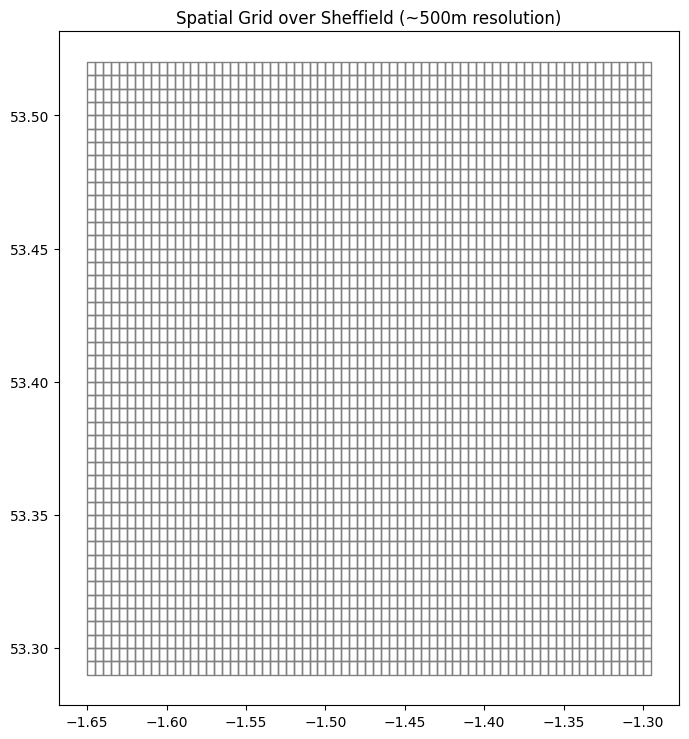

In [31]:
grid.plot(edgecolor='gray', facecolor='none', figsize=(8, 10))
plt.title("Spatial Grid over Sheffield (~500m resolution)")
plt.show()

In [101]:


# Load converted grit bins
df = pd.read_csv("Grit_bins__converted.csv")

# Drop rows with missing coordinates (if any)
df = df.dropna(subset=['longitude', 'latitude'])

# Convert to GeoDataFrame
gdf_grit = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
)

# Spatial join with grid
grid = grid.set_index("cell_id")  # Ensure `grid` from earlier step is still in memory
joined = gpd.sjoin(gdf_grit, grid, how="inner", predicate="within")

# Count grit bins per grid cell
grit_count = joined.groupby("cell_id").size().rename("grit_bin_count")

# Preview output
grit_count.head()


,grit_bin_count
cell_id,
86,1
129,1
315,1
360,4
361,3


In [63]:
# Load the converted tree preservation dataset
df = pd.read_csv("Tree_Preservation_Order_(Points)_converted.csv")
df = df.dropna(subset=['longitude', 'latitude'])

# Convert to GeoDataFrame
gdf_trees = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
)

# Spatial join with the grid
joined = gpd.sjoin(gdf_trees, grid, how="inner", predicate="within")

# Count trees per cell
tree_count = joined.groupby("cell_id").size().rename("tree_count")

# Preview result
tree_count.head()


,tree_count
cell_id,
621,1
706,3
750,1
797,41
843,29


In [65]:
# Load the converted libraries dataset
df = pd.read_csv("Libraries_converted.csv")

# Drop rows missing coordinates
df = df.dropna(subset=['longitude', 'latitude'])

# Convert to GeoDataFrame
gdf_lib = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
)

# Spatial join with the grid
joined = gpd.sjoin(gdf_lib, grid, how="inner", predicate="within")

# Count libraries per cell
library_count = joined.groupby("cell_id").size().rename("library_count")

# Preview result
library_count.head()

,library_count
cell_id,
544,1
940,1
1062,1
1255,1
1351,1


In [66]:
# Load the converted school crossings dataset
df = pd.read_csv("School_Crossings_converted.csv")
df = df.dropna(subset=['longitude', 'latitude'])

# Convert to GeoDataFrame
gdf_crossings = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
)

# Spatial join with the grid
joined = gpd.sjoin(gdf_crossings, grid, how="inner", predicate="within")

# Count crossings per cell
crossing_count = joined.groupby("cell_id").size().rename("crossing_count")

# Preview result
crossing_count.head()

,crossing_count
cell_id,
451,1
497,2
680,1
940,1
1018,1


In [67]:
# Load CCTV cameras
df = pd.read_csv("CCTV_and_Traffic_Cameras_converted.csv")
df = df.dropna(subset=['longitude', 'latitude'])

# Convert to GeoDataFrame
gdf_cctv = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
)

# Spatial join
joined = gpd.sjoin(gdf_cctv, grid, how="inner", predicate="within")

# Count cameras per cell
cctv_count = joined.groupby("cell_id").size().rename("cctv_count")

# Preview result
cctv_count.head()

,cctv_count
cell_id,
1302,1
1310,1
1349,2
1351,1
1356,1


In [68]:
df = pd.read_csv("Household_Waste_Recycling_Centres_converted.csv")
df = df.dropna(subset=["longitude", "latitude"])

# Convert Yes/No to 1/0 for all relevant material columns
material_cols = [
    'paper', 'glass', 'textiles', 'plastic', 'steelcans', 'alicans',
    'bookscddvd', 'card', 'shoes', 'tetrapak', 'furniture', 'motoroil',
    'flotubes', 'grwaste', 'rubble', 'carbat', 'scrapmet', 'wood',
    'hholdbat', 'whitgds', 'mobphone'
]

for col in material_cols:
    if col in df.columns:
        df[col] = df[col].apply(lambda x: 1 if str(x).strip().lower() == "yes" else 0)

# Create recycling score
df["recycling_score"] = df[material_cols].sum(axis=1)

# Convert to GeoDataFrame
gdf_recycling = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
)

# Spatial join
joined = gpd.sjoin(gdf_recycling, grid, how="inner", predicate="within")

# Aggregate
recycling_score = joined.groupby("cell_id")["recycling_score"].max().rename("recycling_score")

# Preview
recycling_score.head()


,recycling_score
cell_id,
818,21
1463,21
1588,21
1806,21
2726,21


In [69]:
# Load the converted drain nodes dataset
df = pd.read_csv("Highway_Drain_Nodes_converted.csv")
df = df.dropna(subset=['longitude', 'latitude'])

# Convert to GeoDataFrame
gdf_nodes = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
)

# Spatial join with the grid
joined = gpd.sjoin(gdf_nodes, grid, how="inner", predicate="within")

# Count drain nodes per cell
drain_node_count = joined.groupby("cell_id").size().rename("drain_node_count")

# Preview result
drain_node_count.head()

,drain_node_count
cell_id,
19,2
65,2
66,1
270,1
315,15


In [70]:
# Load converted SuDS data
df = pd.read_csv("SuDS_Links_converted.csv")
df = df.dropna(subset=["longitude", "latitude"])

# Convert to GeoDataFrame
gdf_suds = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.longitude, df.latitude), crs="EPSG:4326"
)

# Spatial join to grid
joined = gpd.sjoin(gdf_suds, grid, how="inner", predicate="within")

# Count SuDS features per cell
suds_count = joined.groupby("cell_id").size().rename("suds_count")

# Preview result
suds_count.head()

,suds_count
cell_id,
757,1


In [75]:
df = pd.read_csv("Highway_Drain_Links_converted.csv")

# Rename so the rest of your code stays the same
df = df.rename(columns={"length": "pipe_length"})

# Drop any bad points
df = df.dropna(subset=["longitude", "latitude"])

# Coerce to numeric
df["pipe_length"] = pd.to_numeric(df["pipe_length"], errors="coerce")

# Build GeoDataFrame
gdf_links = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df.longitude, df.latitude),
    crs="EPSG:4326"
)

# Spatial join
joined = gpd.sjoin(gdf_links, grid, how="inner", predicate="within")

# Now you can sum 'pipe_length'
pipe_length = (
    joined
    .groupby("cell_id")["pipe_length"]
    .sum()
    .rename("pipe_length_m")
)

print(pipe_length.head())


cell_id
270    210.0
315    541.0
316    709.0
360    165.0
361    252.0
Name: pipe_length_m, dtype: float64


In [79]:
# Index the grid by cell_id
grid_features = grid.set_index("cell_id")

# Join in pipe_length_m (fills NaN with 0)
grid_features = grid_features.join(pipe_length).fillna(0)

# Verify the join by inspecting the pipe_length_m column
print("Joined pipe_length_m head:\n", grid_features["pipe_length_m"].head(10))
print("\nSummary stats for pipe_length_m:\n", grid_features["pipe_length_m"].describe())


Joined pipe_length_m head:
 cell_id
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
5    0.0
6    0.0
7    0.0
8    0.0
9    0.0
Name: pipe_length_m, dtype: float64

Summary stats for pipe_length_m:
 count    3266.000000
mean       47.536130
std       217.868907
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      2916.000000
Name: pipe_length_m, dtype: float64


In [78]:
# If there’s no explicit column, reset the index to get cell_id as a column
if "cell_id" not in grid.columns:
    print("Resetting index to create 'cell_id' column")
    grid = grid.reset_index()  # index name 'cell_id' becomes a column

# Now we can set_index and join as intended
grid_features = grid.set_index("cell_id")
grid_features = grid_features.join(pipe_length).fillna(0)

# Verify the join
print("Joined pipe_length_m head:\n", grid_features["pipe_length_m"].head(10))
print("\nSummary stats for pipe_length_m:\n", grid_features["pipe_length_m"].describe())


Joined pipe_length_m head:
 cell_id
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
5    0.0
6    0.0
7    0.0
8    0.0
9    0.0
Name: pipe_length_m, dtype: float64

Summary stats for pipe_length_m:
 count    3266.000000
mean       47.536130
std       217.868907
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max      2916.000000
Name: pipe_length_m, dtype: float64


In [81]:
# List your other feature Series
features = [
    library_count,
    crossing_count,
    cctv_count,
    recycling_score,
    tree_count,
    drain_node_count,
    suds_count,
    grit_bin_count
]

# Join them all at once (fills missing with 0)
grid_features = grid_features.join(features).fillna(0)

# Verify by inspecting a few columns
cols_to_check = [
    "library_count", "crossing_count", "cctv_count",
    "recycling_score", "tree_count", "drain_node_count",
    "suds_count", "grit_bin_count", "pipe_length_m"
]
print("Head of joined features:\n", grid_features[cols_to_check].head(10))

# Quick summary stats
print("\nSummary stats:\n", grid_features[cols_to_check].describe())


Head of joined features:
          library_count  crossing_count  cctv_count  recycling_score  \
cell_id                                                               
0                  0.0             0.0         0.0              0.0   
1                  0.0             0.0         0.0              0.0   
2                  0.0             0.0         0.0              0.0   
3                  0.0             0.0         0.0              0.0   
4                  0.0             0.0         0.0              0.0   
5                  0.0             0.0         0.0              0.0   
6                  0.0             0.0         0.0              0.0   
7                  0.0             0.0         0.0              0.0   
8                  0.0             0.0         0.0              0.0   
9                  0.0             0.0         0.0              0.0   

         tree_count  drain_node_count  suds_count  grit_bin_count  \
cell_id                                             

In [83]:
from sklearn.preprocessing import MinMaxScaler

# Raw feature columns to normalize
raw_cols = [
    "library_count", "crossing_count", "cctv_count",
    "recycling_score", "tree_count", "drain_node_count",
    "suds_count", "grit_bin_count", "pipe_length_m"
]

# Names for the normalized columns
norm_cols = [f"{c}_norm" for c in raw_cols]

# Instantiate & apply
scaler = MinMaxScaler()
grid_features[norm_cols] = scaler.fit_transform(grid_features[raw_cols])


In [84]:
# Check head of normalized columns
print("Normalized head:\n", grid_features[norm_cols].head(10))

# Summary stats (should all be min=0, max=1)
print("\nNormalized summary:\n", grid_features[norm_cols].describe().loc[["min","max"]])


Normalized head:
          library_count_norm  crossing_count_norm  cctv_count_norm  \
cell_id                                                             
0                       0.0                  0.0              0.0   
1                       0.0                  0.0              0.0   
2                       0.0                  0.0              0.0   
3                       0.0                  0.0              0.0   
4                       0.0                  0.0              0.0   
5                       0.0                  0.0              0.0   
6                       0.0                  0.0              0.0   
7                       0.0                  0.0              0.0   
8                       0.0                  0.0              0.0   
9                       0.0                  0.0              0.0   

         recycling_score_norm  tree_count_norm  drain_node_count_norm  \
cell_id                                                                 
0      

In [90]:
import folium

# Reset index to turn cell_id into a column
gdf = grid_features.reset_index()

# Create base map
m = folium.Map(location=[53.38, -1.47], zoom_start=12)

# Add choropleth, pointing to the new GeoJSON
folium.Choropleth(
    geo_data=gdf.__geo_interface__,     # now each feature has a cell_id property
    data=gdf,
    columns=["cell_id", "equity_score"],
    key_on="feature.properties.cell_id",
    fill_color="YlGnBu",
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Equity Score"
).add_to(m)

# Display
m


In [85]:
from sklearn.cluster import KMeans


# Define the normalized feature columns
norm_cols = [c for c in grid_features.columns if c.endswith("_norm")]

# Fit K-Means with 3 clusters
kmeans3 = KMeans(n_clusters=3, random_state=42)
grid_features["cluster"] = kmeans3.fit_predict(grid_features[norm_cols])

# Verify you have three labels
print("Cluster counts:\n", grid_features["cluster"].value_counts())

# Look at the cluster centers to interpret each group
centers = pd.DataFrame(
    kmeans3.cluster_centers_,
    columns=norm_cols
)
print("\nCluster centers (normalized feature means):\n", centers)

# Preview a handful of rows with their cluster assignment
print("\nSample rows with cluster:\n", grid_features[norm_cols + ["cluster"]].head(10))


Cluster counts:
 cluster
0    2927
2     260
1      79
Name: count, dtype: int64

Cluster centers (normalized feature means):
    library_count_norm  crossing_count_norm  cctv_count_norm  \
0            0.004271             0.004669         0.002814   
1            0.006329             0.012658         0.023083   
2            0.007692             0.012821         0.009276   

   recycling_score_norm  tree_count_norm  drain_node_count_norm  \
0          1.366587e-03         0.003728               0.005493   
1         -3.035766e-18         0.051311               0.348264   
2          3.846154e-03         0.030082               0.013511   

   suds_count_norm  grit_bin_count_norm  pipe_length_m_norm  
0     1.821460e-17             0.059425            0.005709  
1     5.421011e-20             0.095728            0.415794  
2     3.846154e-03             0.377163            0.014172  

Sample rows with cluster:
          library_count_norm  crossing_count_norm  cctv_count_norm  \
cell_i

In [89]:
# Compute composite equity score as the mean of all normalized features
norm_cols = [c for c in grid_features.columns if c.endswith("_norm")]
grid_features["equity_score"] = grid_features[norm_cols].mean(axis=1)

# Verify the new column
print("Equity score head:\n", grid_features["equity_score"].head(10))
print("\nEquity score summary:\n", grid_features["equity_score"].describe())


Equity score head:
 cell_id
0    0.006944
1    0.006944
2    0.006944
3    0.006944
4    0.006944
5    0.006944
6    0.006944
7    0.006944
8    0.006944
9    0.006944
Name: equity_score, dtype: float64

Equity score summary:
 count    3266.000000
mean        0.015451
std         0.024841
min         0.000000
25%         0.006944
50%         0.006944
75%         0.011003
max         0.255244
Name: equity_score, dtype: float64


In [91]:
import geopandas as gpd
uploaded = files.upload()
# Replace with your downloaded file path
wards = gpd.read_file("Sheffield_Wards.geojson")

# Ensure it matches your grid_features CRS
wards = wards.to_crs(grid_features.crs)


Saving Sheffield_Wards.geojson to Sheffield_Wards.geojson


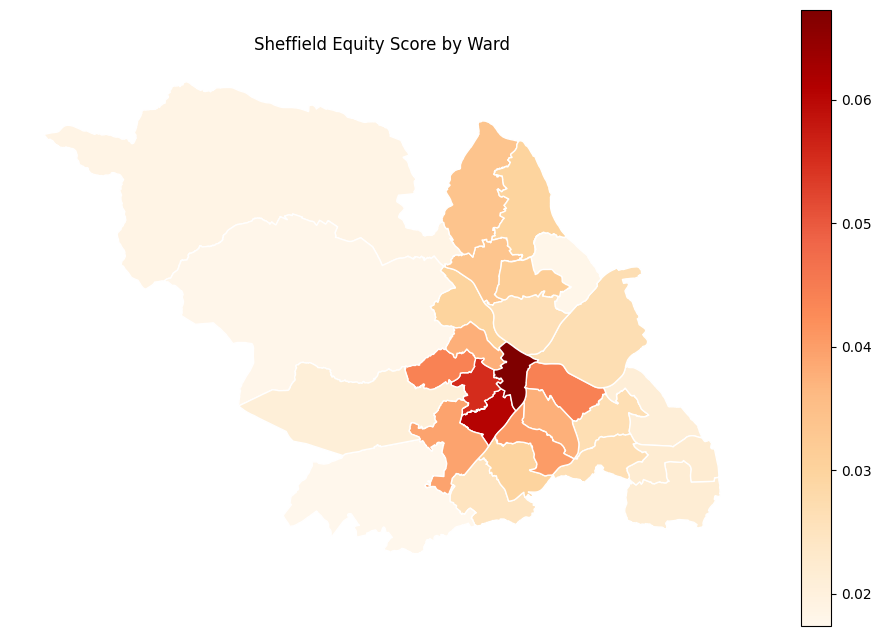

In [102]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
wards.plot(
    column="ward_equity_score",
    cmap="OrRd",
    legend=True,
    edgecolor="white",
    ax=ax
)
ax.set_title("Sheffield Equity Score by Ward")
ax.set_axis_off()
plt.show()


In [95]:

# Reset your grid so raw counts are columns again
grid_gdf = grid_features.reset_index()

# Spatial-join grid cells → wards
wards = gpd.read_file("Sheffield_Wards.geojson").to_crs(grid_features.crs)
merge = gpd.sjoin(
    grid_gdf[
        [
            "cell_id",
            "library_count", "crossing_count", "cctv_count",
            "recycling_score", "tree_count", "drain_node_count",
            "suds_count", "grit_bin_count", "pipe_length_m",
            "geometry"
        ]
    ],
    wards[["admin_name", "geometry"]],
    how="inner",
    predicate="intersects"
)

# Sum or mean features per ward
#    (here we sum counts and lengths, but you could mean or weight as desired)
ward_feats = (
    merge
    .groupby("admin_name")
    .agg({
        "library_count": "sum",
        "crossing_count": "sum",
        "cctv_count": "sum",
        "recycling_score": "sum",
        "tree_count": "sum",
        "drain_node_count": "sum",
        "suds_count": "sum",
        "grit_bin_count": "sum",
        "pipe_length_m": "sum"
    })
    .rename(columns=lambda c: c + "_ward")
)

# Merge back into wards GeoDataFrame
wards = wards.set_index("admin_name").join(ward_feats).fillna(0)


In [103]:
from folium.features import GeoJsonTooltip, GeoJsonPopup

# 1. Load wards (GeoJSON) & match CRS
wards = gpd.read_file("Sheffield_Wards.geojson").to_crs(grid_features.crs)

# 2. Reset grid index so we have cell_id & equity_score columns
grid_gdf = grid_features.reset_index()[["cell_id", "equity_score", "geometry",
                                        "library_count", "crossing_count", "cctv_count",
                                        "recycling_score", "tree_count", "drain_node_count",
                                        "suds_count", "grit_bin_count", "pipe_length_m"]]

# 3. Spatially join grid → wards on admin_name
merged = gpd.sjoin(
    grid_gdf,
    wards[["admin_name", "geometry"]],
    how="inner",
    predicate="intersects"
)

# 4. Aggregate per ward:
#  4a. Sum raw features
ward_feats = merged.groupby("admin_name").agg({
    "library_count":       "sum",
    "crossing_count":      "sum",
    "cctv_count":          "sum",
    "recycling_score":     "sum",
    "tree_count":          "sum",
    "drain_node_count":    "sum",
    "suds_count":          "sum",
    "grit_bin_count":      "sum",
    "pipe_length_m":       "sum"
}).rename(columns=lambda c: c + "_ward")

#  4b. Mean equity_score
ward_equity = merged.groupby("admin_name")["equity_score"]\
                     .mean()\
                     .rename("ward_equity_score")

# 5. Merge both back into wards
wards = (
    wards
    .set_index("admin_name")
    .join(ward_feats)
    .join(ward_equity)
    .fillna(0)
    .reset_index()
)

# 6. Build interactive Folium map
m = folium.Map(location=[53.38, -1.47], zoom_start=12)

# 6a. Choropleth by ward_equity_score
folium.Choropleth(
    geo_data=wards,
    data=wards,
    columns=["admin_name", "ward_equity_score"],
    key_on="feature.properties.admin_name",
    fill_color="YlGnBu",
    fill_opacity=0.6,
    line_opacity=0.3,
    legend_name="Equity Score"
).add_to(m)

# 6b. Overlay GeoJson for tooltips/popups
folium.GeoJson(
    wards,
    style_function=lambda f: {"fillOpacity": 0, "color":"white","weight":1},
    highlight_function=lambda f: {"weight":3, "color":"black"},
    tooltip=GeoJsonTooltip(
        fields=["admin_name", "tree_count_ward", "grit_bin_count_ward"],
        aliases=["Ward","Trees","Grit Bins"],
        localize=True,
        sticky=True
    ),
    popup=GeoJsonPopup(
        fields=[
            "admin_name",
            "library_count_ward", "crossing_count_ward", "cctv_count_ward",
            "recycling_score_ward", "tree_count_ward", "drain_node_count_ward",
            "suds_count_ward", "grit_bin_count_ward", "pipe_length_m_ward"
        ],
        aliases=[
            "Ward","Libraries","Crossings","CCTV",
            "Recycling","Trees","Drain Nodes",
            "SuDS","Grit Bins","Pipe Length (m)"
        ],
        localize=True
    )
).add_to(m)

# 7. Display
m
